In [4]:
import nltk
import re, string, unicodedata
import inflect
from bs4 import BeautifulSoup
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer
import math

In [5]:
def CleanWOrds(words,user,Clean_Words):
   
    def remove_non_ascii(words):
        """Remove non-ASCII characters from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
            new_words.append(new_word)
        return new_words

    def to_lowercase(words):
        """Convert all characters to lowercase from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = word.lower()
            new_words.append(new_word)
        return new_words

    def remove_punctuation(words):
        """Remove punctuation from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = re.sub(r'[^\w\s]', '', word)
            if new_word != '':
                new_words.append(new_word)
        return new_words

    def replace_numbers(words):
        """Replace all interger occurrences in list of tokenized words with textual representation"""
        p = inflect.engine()
        new_words = []
        for word in words:
            if word.isdigit():
                new_word = p.number_to_words(word)
                new_words.append(new_word)
            else:
                new_words.append(word)
        return new_words

    def remove_stopwords(words):
        """Remove stop words from list of tokenized words"""
        new_words = []
        for word in words:
            if word not in stopwords.words('spanish'):
                new_words.append(word)
        return new_words

    def stem_words(words):
        """Stem words in list of tokenized words"""
        stemmer = LancasterStemmer()
        stems = []
        for word in words:
            stem = stemmer.stem(word)
            stems.append(stem)
        return stems

    def lemmatize_verbs(words):
        """Lemmatize verbs in list of tokenized words"""
        lemmatizer = WordNetLemmatizer()
        lemmas = []
        for word in words:
            lemma = lemmatizer.lemmatize(word, pos='v')
            lemmas.append(lemma)
        return lemmas

    def normalize(words):
        words = remove_non_ascii(words)
        words = to_lowercase(words)
        words = remove_punctuation(words)
        words = replace_numbers(words)
        words = remove_stopwords(words)
        return words

    words = normalize(words)
    #print(words)
    #print (user,"\n",words)
    
    Clean_Words=Clean_Words.append(words)
    return (words,user,Clean_Words)


In [6]:
# imports needed and set up logging
import gzip
import gensim 
import logging
import zipfile
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [7]:
STWRD=['anos','ello','deben','jr','merced','urb','torre','falta','partido','politica','nivel','ademas','gob','pe','asi','nacional','politica','peruano','debe','pais','peru','sua','llulla','plan','gobierno','ama','quella','mas','ano','un','una','unas','unos','uno','sobre','todo','tambien','tras','otro','algun','alguno','alguna','algunos','algunas','ser','es','soy','eres','somos','sois','estoy','esta','estamos','estais','estan','como','en','para','atras','porque','por que','estado','estaba','ante','antes','siendo','ambos','pero','por','poder','puede','puedo','podemos','podeis','pueden','fui','fue','fuimos','fueron','hacer','hago','hace','hacemos','haceis','hacen','cada','fin','incluso','primero','desde','conseguir','consigo','consigue','consigues','conseguimos','consiguen','ir','voy','va','vamos','vais','van','vaya','gueno','ha','tener','tengo','tiene','tenemos','teneis','tienen','el','la','lo','las','los','su','aqui','mio','tuyo','ellos','ellas','nos','nosotros','vosotros','vosotras','si','dentro','solo','solamente','saber','sabes','sabe','sabemos','sabeis','saben','ultimo','largo','bastante','haces','muchos','aquellos','aquellas','sus','entonces','tiempo','verdad','verdadero','verdadera','cierto','ciertos','cierta','ciertas','intentar','intento','intenta','intentas','intentamos','intentais','intentan','dos','bajo','arriba','encima','usar','uso','usas','usa','usamos','usais','usan','emplear','empleo','empleas','emplean','ampleamos','empleais','valor','muy','era','eras','eramos','eran','modo','bien','cual','cuando','donde','mientras','quien','con','entre','sin','trabajo','trabajar','trabajas','trabaja','trabajamos','trabajais','trabajan','podria','podrias','podriamos','podrian','podriais','yo','aquel']

In [8]:

def setup(data_file):
    def read_input(input_file):
        """This method reads the input file which is in gzip format"""

        logging.info("reading file {0}...this may take a while".format(input_file))

        with open (input_file, 'rb') as f:
            for i, line in enumerate (f): 

                if (i%10000==0):
                    logging.info ("read {0} reviews".format (i))
                # hacer un preprocesamiento y devolver una lista de palabras para cada texto de revisión
                yield gensim.utils.simple_preprocess (line)

    # leyó las críticas tokenizadas en una lista
    # cada elemento de la revisión se convierte en una serie de palabras
    # entonces esto se convierte en una lista de listas
    documents = list (read_input (data_file))
    logging.info ("Done reading data file") 

    g=[]
    for h in documents:
        for s in h:
            g.append(s)
    #print(g)
    TextPlan2030 = " ".join([str(k) for k in g])
    #print(TextPlan2030)

    user=0
    Clean_Words=[]

    UserList=[]
    data = "".join(TextPlan2030)
    words = nltk.word_tokenize(data)
    CleanWOrds(words,user,Clean_Words)

    g=[]
    v=0
    for h in Clean_Words:
        for s in h:
            for z in STWRD:
                if s==z:
                    v=v+1
            if v==0:
                g.append(s)
            v=0
                    #print(g)
    #print(g)

    Plan_CP = " ".join([str(k) for k in g])

    #print(TextPlan2030)
    return (Plan_CP)

In [9]:

data_file="accion_pupular.txt"
accion_pupular_text=setup(data_file)

data_file="Partido_Morado.txt"
Partido_Morado_text=setup(data_file)

data_file="Partido_Avanza_Pais.txt"
Partido_Avanza_Pais_text=setup(data_file)

data_file="Alianza_Progreso.txt"
Alianza_Progreso_text=setup(data_file)

data_file="APRA.txt"
APRA_text=setup(data_file)

data_file="Democracia_directa.txt"
Democracia_directa_text=setup(data_file)

data_file="Frente_amplio.txt"
Frente_amplio_text=setup(data_file)

data_file="Frente_esperanza.txt"
Frente_esperanza_text=setup(data_file)

data_file="Fuerza_popular.txt"
Fuerza_popular_text=setup(data_file)

data_file="Juntos_peru.txt"
Juntos_peru_text=setup(data_file)

data_file="Partido_nacionalista.txt"
Partido_nacionalista_text=setup(data_file)

data_file="Peru_libre.txt"
Peru_libre_text=setup(data_file)

data_file="Patria_segura.txt"
Patria_segura_text=setup(data_file)

data_file="Podemos.txt"
Podemos_text=setup(data_file)

data_file="PPC.txt"
PPC_text=setup(data_file)

data_file="Renovacion_pupular.txt"
Renovacion_pupular_text=setup(data_file)

data_file="Somos_peru.txt"
Somos_peru_text=setup(data_file)

data_file="Union_peru.txt"
Union_peru_text=setup(data_file)

data_file="Victoria_nacional.txt"
Victoria_nacional_text=setup(data_file)





2021-03-17 11:31:22,047 : INFO : reading file accion_pupular.txt...this may take a while
2021-03-17 11:31:22,109 : INFO : read 0 reviews
2021-03-17 11:31:22,131 : INFO : Done reading data file
2021-03-17 11:31:23,108 : INFO : reading file Partido_Morado.txt...this may take a while
2021-03-17 11:31:23,128 : INFO : read 0 reviews
2021-03-17 11:31:23,173 : INFO : Done reading data file
2021-03-17 11:31:26,768 : INFO : reading file Partido_Avanza_Pais.txt...this may take a while
2021-03-17 11:31:26,874 : INFO : read 0 reviews
2021-03-17 11:31:26,889 : INFO : Done reading data file
2021-03-17 11:31:27,329 : INFO : reading file Alianza_Progreso.txt...this may take a while
2021-03-17 11:31:27,421 : INFO : read 0 reviews
2021-03-17 11:31:27,502 : INFO : Done reading data file
2021-03-17 11:31:33,933 : INFO : reading file APRA.txt...this may take a while
2021-03-17 11:31:34,147 : INFO : read 0 reviews
2021-03-17 11:31:34,173 : INFO : Done reading data file
2021-03-17 11:31:35,156 : INFO : readi

In [32]:
Corpus=[]
Corpus.append([accion_pupular_text])
Corpus.append([Partido_Morado_text])
Corpus.append([Partido_Avanza_Pais_text])
Corpus.append([Alianza_Progreso_text])
Corpus.append([APRA_text])
Corpus.append([Democracia_directa_text])
Corpus.append([Frente_amplio_text])
Corpus.append([Frente_esperanza_text])
Corpus.append([Fuerza_popular_text])
Corpus.append([Juntos_peru_text])
Corpus.append([Partido_nacionalista_text])
Corpus.append([Peru_libre_text])
Corpus.append([Patria_segura_text])
Corpus.append([Podemos_text])
Corpus.append([PPC_text])
Corpus.append([Renovacion_pupular_text])
Corpus.append([Somos_peru_text])
Corpus.append([Union_peru_text])
Corpus.append([Victoria_nacional_text])

In [24]:
NombreP=['Accion Popular','Partido Morado','Avanza Pais','Alianza para el Progreso'
,'APRA','Democracia Directa','Frente Amplio','Frente Esperanza','Fuerza Popular','Juntos por el Peru',
'Partido Nacionalista','Peru Libre','Patria Segura','Podemos Peru','PPC','Renovavion Popular','Somos Peru','Union por el Peru','Victoria Nacional'
]


In [38]:
def ploteo(Text_P,i,NombreP):
    original_wc = cloud = WordCloud(width = 812, height = 512, background_color='white', stopwords=STOPWORDS).generate(Text_P)
    fig.add_subplot(4, 4, i + 1)
    plt.imshow(original_wc, interpolation='bilinear', alpha=1)
    plt.axis("off")
    plt.title(NombreP)

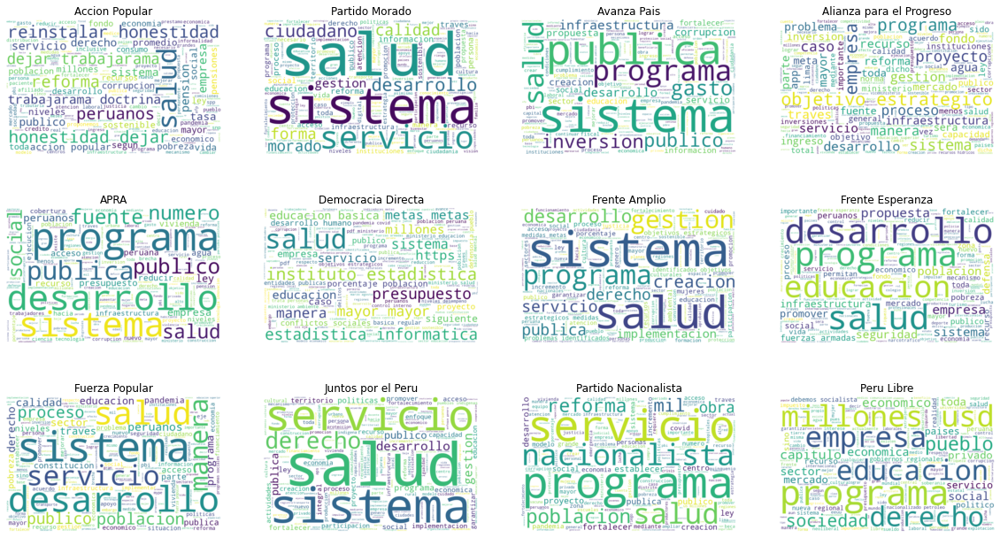

In [60]:
import wikipedia
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
fig = plt.figure(num=12, figsize=(20, 15))
c=0
for i, sentiment in enumerate(['Primera fila','Suegunda fila','tercera fila']):
    if i == 1: i = 4
    elif i == 2: i = 8
    #Text = " ".join([str(k) for k in Corpus[4]])
    Text_P=" ".join([str(k) for k in Corpus[c]])
    PLT=ploteo(Text_P,i+0,NombreP=NombreP[c])
    
    Text_P=" ".join([str(k) for k in Corpus[c+1]])
    PLT=ploteo(Text_P,i+1,NombreP=NombreP[c+1])

    Text_P=" ".join([str(k) for k in Corpus[c+2]])
    PLT=ploteo(Text_P,i+2,NombreP=NombreP[c+2])
    
    Text_P=" ".join([str(k) for k in Corpus[c+3]])
    PLT=ploteo(Text_P,i+3,NombreP=NombreP[c+3])
    
    c=c+4
plt.show()

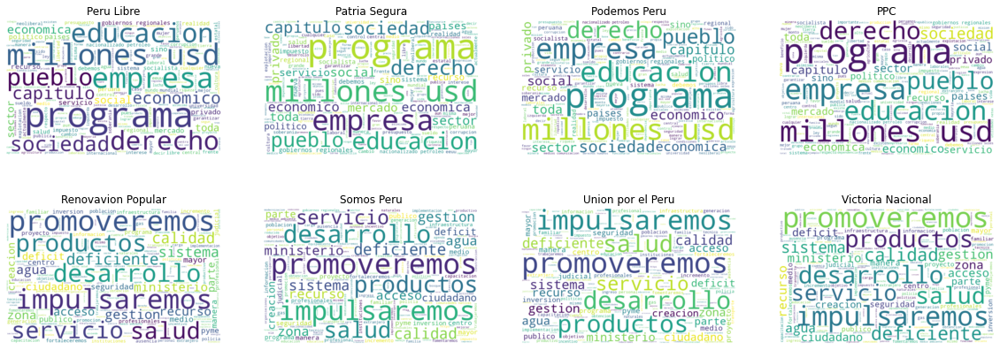

In [64]:
fig = plt.figure(num=12, figsize=(20, 15))
c=11
for i, sentiment in enumerate(['Primera fila','Suegunda fila']):
    if i == 1: i = 4
    elif i == 2: i = 8
        
    Text_P=" ".join([str(k) for k in Corpus[c]])
    PLT=ploteo(Text_P,i+0,NombreP=NombreP[c])
    
    Text_P=" ".join([str(k) for k in Corpus[c]])
    PLT=ploteo(Text_P,i+1,NombreP=NombreP[c+1])

    Text_P=" ".join([str(k) for k in Corpus[c]])
    PLT=ploteo(Text_P,i+2,NombreP=NombreP[c+2])
    
    Text_P=" ".join([str(k) for k in Corpus[c]])
    PLT=ploteo(Text_P,i+3,NombreP=NombreP[c+3])
    
    c=c+4
plt.show()

In [14]:
# Python3 implementation of above approach 
from math import floor, ceil 
  
# Function to calculate the 
# Jaro Similarity of two s 
def jaro_distance(s1, s2): 
      
    # If the s are equal 
    if (s1 == s2): 
        return 1.0
  
    # Length of two s 
    len1 = len(s1) 
    len2 = len(s2) 
  
    # Maximum distance upto which matching 
    # is allowed 
    max_dist = floor(max(len1, len2) / 2) - 1
  
    # Count of matches 
    match = 0
  
    # Hash for matches 
    hash_s1 = [0] * len(s1) 
    hash_s2 = [0] * len(s2) 
  
    # Traverse through the first 
    for i in range(len1): 
  
        # Check if there is any matches 
        for j in range(max(0, i - max_dist),  
                       min(len2, i + max_dist + 1)): 
              
            # If there is a match 
            if (s1[i] == s2[j] and hash_s2[j] == 0): 
                hash_s1[i] = 1
                hash_s2[j] = 1
                match += 1
                break
  
    # If there is no match 
    if (match == 0): 
        return 0.0
  
    # Number of transpositions 
    t = 0
    point = 0
  
    # Count number of occurances 
    # where two characters match but 
    # there is a third matched character 
    # in between the indices 
    for i in range(len1): 
        if (hash_s1[i]): 
  
            # Find the next matched character 
            # in second 
            while (hash_s2[point] == 0): 
                point += 1
  
            if (s1[i] != s2[point]): 
                point += 1
                t += 1
    t = t//2
  
    # Return the Jaro Similarity 
    return (match/ len1 + match / len2 + 
            (match - t + 1) / match)/ 3.0
  

In [157]:
CP=Corpus

In [162]:
c=0
cadena=[]
for p in Corpus:
    #for i in p:
    x=0
    for case in CP:
            #for j in case:
            s1 = p
            s2 = case
            #print(s1)
            #print(s2)
            # Prjaro Similarity of two s 
            d=round(jaro_distance(s1, s2),6)
            cadena.append(NombreP[c])
            cadena.append(NombreP[x])
            cadena.append(d)
            #print(cadena)
            #print(NombreP[c]," con ",NombreP[x], " similitud ", d)
            x=x+1
    c=c+1

In [168]:
for gg in cadena:
    print(gg,"\n")

Accion Popular 

Accion Popular 

1.0 

Accion Popular 

Partido Morado 

0.575843 

Accion Popular 

Avanza Pais 

0.724887 

Accion Popular 

Alianza para el Progreso 

0.55005 

Accion Popular 

APRA 

0.743515 

Accion Popular 

Democracia Directa 

0.651307 

Accion Popular 

Frente Amplio 

0.640843 

Accion Popular 

Frente Esperanza 

0.739887 

Accion Popular 

Fuerza Popular 

0.620264 

Accion Popular 

Juntos por el Peru 

0.625261 

Accion Popular 

Partido Nacionalista 

0.684624 

Accion Popular 

Peru Libre 

0.649489 

Accion Popular 

Patria Segura 

0.567246 

Accion Popular 

Podemos Peru 

0.624812 

Accion Popular 

PPC 

0.582629 

Accion Popular 

Renovavion Popular 

0.755441 

Accion Popular 

Somos Peru 

0.572165 

Accion Popular 

Union por el Peru 

0.789765 

Accion Popular 

Victoria Nacional 

0.572602 

Partido Morado 

Accion Popular 

0.575843 

Partido Morado 

Partido Morado 

1.0 

Partido Morado 

Avanza Pais 

0.552457 

Partido Morado 

Alianza

In [174]:
cadena

['Accion Popular',
 'Accion Popular',
 1.0,
 'Accion Popular',
 'Partido Morado',
 0.575843,
 'Accion Popular',
 'Avanza Pais',
 0.724887,
 'Accion Popular',
 'Alianza para el Progreso',
 0.55005,
 'Accion Popular',
 'APRA',
 0.743515,
 'Accion Popular',
 'Democracia Directa',
 0.651307,
 'Accion Popular',
 'Frente Amplio',
 0.640843,
 'Accion Popular',
 'Frente Esperanza',
 0.739887,
 'Accion Popular',
 'Fuerza Popular',
 0.620264,
 'Accion Popular',
 'Juntos por el Peru',
 0.625261,
 'Accion Popular',
 'Partido Nacionalista',
 0.684624,
 'Accion Popular',
 'Peru Libre',
 0.649489,
 'Accion Popular',
 'Patria Segura',
 0.567246,
 'Accion Popular',
 'Podemos Peru',
 0.624812,
 'Accion Popular',
 'PPC',
 0.582629,
 'Accion Popular',
 'Renovavion Popular',
 0.755441,
 'Accion Popular',
 'Somos Peru',
 0.572165,
 'Accion Popular',
 'Union por el Peru',
 0.789765,
 'Accion Popular',
 'Victoria Nacional',
 0.572602,
 'Partido Morado',
 'Accion Popular',
 0.575843,
 'Partido Morado',
 'Parti

In [178]:
import csv
with open('JaroW.csv', 'w') as csvfile:
    fieldnames = ['Id_PG1','Id_PG2','JaroW_Dictance']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()
    word=0
    for i in range(int(len(cadena)/3)):
        
        #for j in range(int(len(i)/3)):
        Id_Cv1=cadena[word]
        print(Id_Cv1)
        Id_Cv2=cadena[word+1]
        print(Id_Cv2)
        Rating_general=cadena[word+2]
        print(Rating_general)
        writer.writerow({'Id_PG1': Id_Cv1,
                         'Id_PG2':Id_Cv2,
                         'JaroW_Dictance':Rating_general })
        cont=word+2
        word=cont+1

Accion Popular
Accion Popular
1.0
Accion Popular
Partido Morado
0.575843
Accion Popular
Avanza Pais
0.724887
Accion Popular
Alianza para el Progreso
0.55005
Accion Popular
APRA
0.743515
Accion Popular
Democracia Directa
0.651307
Accion Popular
Frente Amplio
0.640843
Accion Popular
Frente Esperanza
0.739887
Accion Popular
Fuerza Popular
0.620264
Accion Popular
Juntos por el Peru
0.625261
Accion Popular
Partido Nacionalista
0.684624
Accion Popular
Peru Libre
0.649489
Accion Popular
Patria Segura
0.567246
Accion Popular
Podemos Peru
0.624812
Accion Popular
PPC
0.582629
Accion Popular
Renovavion Popular
0.755441
Accion Popular
Somos Peru
0.572165
Accion Popular
Union por el Peru
0.789765
Accion Popular
Victoria Nacional
0.572602
Partido Morado
Accion Popular
0.575843
Partido Morado
Partido Morado
1.0
Partido Morado
Avanza Pais
0.552457
Partido Morado
Alianza para el Progreso
0.712314
Partido Morado
APRA
0.603758
Partido Morado
Democracia Directa
0.664654
Partido Morado
Frente Amplio
0.6776

In [10]:
# imports needed and set up logging
import gzip
import gensim 
import logging

logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
import zipfile

data_file="plan2030.txt"

with open ('plan2030.txt', 'rb') as f:
    for i,line in enumerate (f):
        Data=line
        print(line)

b"Informe especial: Los Objetivos de Desarrollo Sostenible de la Agenda 2030 y los Planes de Gobierno', 'Pr\xc3\xb3logoLos 17 Objetivos de Desarrollo Sostenible (ODS) son parte de la Agenda 2030, un ambicioso plan de acci\xc3\xb3n para la humanidad que fue aprobado por 193 pa\xc3\xadses en 2015. Casi seis a\xc3\xb1os despu\xc3\xa9s, y en vista de los duros impactos sanitarios y socioecon\xc3\xb3micos de la pandemia por COVID-19, es entendible que muchos se pregunten si sigue siendo relevante un plan que buscaba nada menos que transformar al mundo hacia el esta crisis global, los ODS y sus metas podr\xc3\xadan estar demasiado lejos de nuestro alcance.Sin embargo, todos los organismos que integran el Sistema de Naciones Unidas consideramos hoy que acelerar los avances en la Agenda 2030 es m\xc3\xa1s relevante que nunca para recuperarnos y para construir un mundo mejor. Ante todo, porque nos proporciona la visi\xc3\xb3n de futuro y la hoja de ruta hacia el desarrollo sostenible m\xc3\xa1s

In [11]:
def read_input(input_file):
    """This method reads the input file which is in gzip format"""
    
    logging.info("reading file {0}...this may take a while".format(input_file))
    
    with open (input_file, 'rb') as f:
        for i, line in enumerate (f): 

            if (i%10000==0):
                logging.info ("read {0} reviews".format (i))
            # hacer un preprocesamiento y devolver una lista de palabras para cada texto de revisión
            yield gensim.utils.simple_preprocess (line)

# leyó las críticas tokenizadas en una lista
# cada elemento de la revisión se convierte en una serie de palabras
# entonces esto se convierte en una lista de listas
documents = list (read_input (data_file))
logging.info ("Done reading data file") 

g=[]
for h in documents:
    for s in h:
        g.append(s)
#print(g)
TextPlan2030 = " ".join([str(k) for k in g])
#print(TextPlan2030)

user=0
Clean_Words=[]

UserList=[]
data = ''.join(TextPlan2030)
words = nltk.word_tokenize(data)
CleanWOrds(words,user,Clean_Words)

g=[]
for h in Clean_Words:
    for s in h:
        g.append(s)
#print(g)

TextPlan2030 = " ".join([str(k) for k in g])
#print(TextPlan2030)


2021-03-14 10:09:42,354 : INFO : reading file plan2030.txt...this may take a while
2021-03-14 10:09:42,355 : INFO : read 0 reviews
2021-03-14 10:09:42,363 : INFO : Done reading data file


In [12]:
TextPlan2030

'informe especial objetivos desarrollo sostenible agenda planes gobierno prologolos objetivos desarrollo sostenible ods parte agenda ambicioso plan accion humanidad aprobado paises casi seis anos despues vista duros impactos sanitarios socioeconomicos pandemia covid entendible pregunten si sigue siendo relevante plan buscaba menos transformar mundo hacia crisis global ods metas podrian demasiado lejos alcance embargo organismos integran sistema naciones unidas consideramos hoy acelerar avances agenda mas relevante nunca recuperarnos construir mundo mejor proporciona vision futuro hoja ruta hacia desarrollo sostenible mas ampliamente compartidas conocido justamente pandemia asimismo mantiene vigente puesto evidencia necesidad abordar problemas estruc turales desigualdades mejor preparados prevenir enfrentar proximos desafios simi prioridades desarrollo alientan inversiones bienes publicos criticos sistemas proteccion social provision servicios salud agua educacion permiten hacer frente 

In [16]:
c=0
cadena2=[]
for p in Corpus:
    #for i in p:
    
    s1 = p
    s2 = TextPlan2030
    #print(s1)
    #print(s2)
    # Prjaro Similarity of two s 
    d=round(jaro_distance(s1, s2),6)
    cadena2.append(NombreP[c])
    cadena2.append("Agenda 2030")
    cadena2.append(d)
    print(NombreP[c]," con ","Agenda 2030", " similitud ", d)
            
    c=c+1

Accion Popular  con  Agenda 2030  similitud  0.727539
Partido Morado  con  Agenda 2030  similitud  0.553402
Avanza Pais  con  Agenda 2030  similitud  0.805236
Alianza para el Progreso  con  Agenda 2030  similitud  0.536735
APRA  con  Agenda 2030  similitud  0.662496
Democracia Directa  con  Agenda 2030  similitud  0.602672
Frente Amplio  con  Agenda 2030  similitud  0.59549
Frente Esperanza  con  Agenda 2030  similitud  0.660532
Fuerza Popular  con  Agenda 2030  similitud  0.581991
Juntos por el Peru  con  Agenda 2030  similitud  0.585625
Partido Nacionalista  con  Agenda 2030  similitud  0.623859
Peru Libre  con  Agenda 2030  similitud  0.601373
Patria Segura  con  Agenda 2030  similitud  0.547742
Podemos Peru  con  Agenda 2030  similitud  0.585208
PPC  con  Agenda 2030  similitud  0.558062
Renovavion Popular  con  Agenda 2030  similitud  0.798451
Somos Peru  con  Agenda 2030  similitud  0.550809
Union por el Peru  con  Agenda 2030  similitud  0.694414
Victoria Nacional  con  Agenda 2

In [17]:
cadena2

['Accion Popular',
 'Agenda 2030',
 0.727539,
 'Partido Morado',
 'Agenda 2030',
 0.553402,
 'Avanza Pais',
 'Agenda 2030',
 0.805236,
 'Alianza para el Progreso',
 'Agenda 2030',
 0.536735,
 'APRA',
 'Agenda 2030',
 0.662496,
 'Democracia Directa',
 'Agenda 2030',
 0.602672,
 'Frente Amplio',
 'Agenda 2030',
 0.59549,
 'Frente Esperanza',
 'Agenda 2030',
 0.660532,
 'Fuerza Popular',
 'Agenda 2030',
 0.581991,
 'Juntos por el Peru',
 'Agenda 2030',
 0.585625,
 'Partido Nacionalista',
 'Agenda 2030',
 0.623859,
 'Peru Libre',
 'Agenda 2030',
 0.601373,
 'Patria Segura',
 'Agenda 2030',
 0.547742,
 'Podemos Peru',
 'Agenda 2030',
 0.585208,
 'PPC',
 'Agenda 2030',
 0.558062,
 'Renovavion Popular',
 'Agenda 2030',
 0.798451,
 'Somos Peru',
 'Agenda 2030',
 0.550809,
 'Union por el Peru',
 'Agenda 2030',
 0.694414,
 'Victoria Nacional',
 'Agenda 2030',
 0.550795]

In [19]:
import csv
with open('JaroW_agenda_2030.csv', 'w') as csvfile:
    fieldnames = ['Id_PG1','Id_PG2','JaroW_Dictance']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()
    word=0
    for i in range(int(len(cadena2)/3)):
        
        #for j in range(int(len(i)/3)):
        Id_Cv1=cadena2[word]
        print(Id_Cv1)
        Id_Cv2=cadena2[word+1]
        print(Id_Cv2)
        Rating_general=cadena2[word+2]
        print(Rating_general)
        writer.writerow({'Id_PG1': Id_Cv1,
                         'Id_PG2':Id_Cv2,
                         'JaroW_Dictance':Rating_general })
        cont=word+2
        word=cont+1

Accion Popular
Agenda 2030
0.727539
Partido Morado
Agenda 2030
0.553402
Avanza Pais
Agenda 2030
0.805236
Alianza para el Progreso
Agenda 2030
0.536735
APRA
Agenda 2030
0.662496
Democracia Directa
Agenda 2030
0.602672
Frente Amplio
Agenda 2030
0.59549
Frente Esperanza
Agenda 2030
0.660532
Fuerza Popular
Agenda 2030
0.581991
Juntos por el Peru
Agenda 2030
0.585625
Partido Nacionalista
Agenda 2030
0.623859
Peru Libre
Agenda 2030
0.601373
Patria Segura
Agenda 2030
0.547742
Podemos Peru
Agenda 2030
0.585208
PPC
Agenda 2030
0.558062
Renovavion Popular
Agenda 2030
0.798451
Somos Peru
Agenda 2030
0.550809
Union por el Peru
Agenda 2030
0.694414
Victoria Nacional
Agenda 2030
0.550795


In [21]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("JaroW.csv") 
df

,Id_PG1,Id_PG2,JaroW_Dictance
0,Accion Popular,Accion Popular,1.000000
1,Accion Popular,Partido Morado,0.575843
2,Accion Popular,Avanza Pais,0.724887
3,Accion Popular,Alianza para el Progreso,0.550050
4,Accion Popular,APRA,0.743515
...,...,...,...
356,Victoria Nacional,PPC,0.794257
357,Victoria Nacional,Renovavion Popular,0.556322
358,Victoria Nacional,Somos Peru,0.835658
359,Victoria Nacional,Union por el Peru,0.583906


In [22]:
ratings_df = pd.DataFrame(df, columns = ['Id_PG1', 'Id_PG2', 'JaroW_Dictance'])
ratings_df.head()

,Id_PG1,Id_PG2,JaroW_Dictance
0,Accion Popular,Accion Popular,1.000000
1,Accion Popular,Partido Morado,0.575843
2,Accion Popular,Avanza Pais,0.724887
3,Accion Popular,Alianza para el Progreso,0.550050
4,Accion Popular,APRA,0.743515


In [23]:
R_df = ratings_df.pivot(
    index = 'Id_PG1', columns ='Id_PG2', values = 'JaroW_Dictance').fillna(0)
R_df.head(10)

Id_PG2,APRA,Accion Popular,Alianza para el Progreso,Avanza Pais,Democracia Directa,Frente Amplio,Frente Esperanza,Fuerza Popular,Juntos por el Peru,PPC,Partido Morado,Partido Nacionalista,Patria Segura,Peru Libre,Podemos Peru,Renovavion Popular,Somos Peru,Union por el Peru,Victoria Nacional
Id_PG1,,,,,,,,,,,,,,,,,,,
APRA,1.000000,0.743770,0.566984,0.660323,0.711576,0.696604,0.831361,0.666722,0.674187,0.613246,0.604172,0.758998,0.591676,0.709032,0.673281,0.682064,0.598484,0.786360,0.598870
Accion Popular,0.743515,1.000000,0.550050,0.724887,0.651307,0.640843,0.739887,0.620264,0.625261,0.582629,0.575843,0.684624,0.567246,0.649489,0.624812,0.755441,0.572165,0.789765,0.572602
Alianza para el Progreso,0.566805,0.549991,1.000000,0.536047,0.603602,0.611852,0.567705,0.631244,0.625588,0.693535,0.712359,0.586673,0.742870,0.605776,0.626597,0.539594,0.724720,0.557433,0.723749
Avanza Pais,0.660560,0.724694,0.535595,1.000000,0.601018,0.594782,0.658458,0.581051,0.584500,0.556861,0.552695,0.623063,0.546796,0.600098,0.584020,0.800662,0.550137,0.691455,0.550086
Democracia Directa,0.711821,0.651511,0.603757,0.600973,1.000000,0.815454,0.714469,0.768365,0.780910,0.680332,0.664280,0.778888,0.644420,0.822163,0.778853,0.614267,0.655445,0.677059,0.656114
Frente Amplio,0.696645,0.641186,0.611792,0.594295,0.816016,1.000000,0.699283,0.789953,0.803288,0.695000,0.677836,0.759606,0.655826,0.819037,0.801600,0.606533,0.668095,0.665360,0.668787
Frente Esperanza,0.831434,0.739909,0.568002,0.658357,0.714600,0.699238,1.000000,0.669266,0.676780,0.614961,0.605327,0.762594,0.592697,0.711449,0.675673,0.679520,0.599869,0.782744,0.600295
Fuerza Popular,0.666712,0.619878,0.631155,0.580971,0.768328,0.790133,0.669337,1.000000,0.823735,0.730129,0.709458,0.719672,0.683535,0.772573,0.828869,0.591712,0.698165,0.640457,0.698916
Juntos por el Peru,0.674764,0.625582,0.625759,0.584433,0.781083,0.803365,0.676961,0.823910,1.000000,0.719624,0.700139,0.730363,0.675225,0.785098,0.829875,0.595089,0.689463,0.646493,0.689993


In [24]:
by_year = R_df.sort_values('Accion Popular',ascending=False)
by_year.head()

Id_PG2,APRA,Accion Popular,Alianza para el Progreso,Avanza Pais,Democracia Directa,Frente Amplio,Frente Esperanza,Fuerza Popular,Juntos por el Peru,PPC,Partido Morado,Partido Nacionalista,Patria Segura,Peru Libre,Podemos Peru,Renovavion Popular,Somos Peru,Union por el Peru,Victoria Nacional
Id_PG1,,,,,,,,,,,,,,,,,,,
Accion Popular,0.743515,1.000000,0.550050,0.724887,0.651307,0.640843,0.739887,0.620264,0.625261,0.582629,0.575843,0.684624,0.567246,0.649489,0.624812,0.755441,0.572165,0.789765,0.572602
Union por el Peru,0.786507,0.789707,0.557285,0.691681,0.677552,0.664935,0.782294,0.639866,0.646339,0.595754,0.588153,0.716626,0.577446,0.675052,0.645532,0.717805,0.583517,1.000000,0.583819
Renovavion Popular,0.682282,0.754927,0.539831,0.800367,0.614662,0.606454,0.679540,0.591208,0.595237,0.563590,0.558077,0.638696,0.552510,0.612656,0.594125,1.000000,0.555488,0.717776,0.555610
APRA,1.000000,0.743770,0.566984,0.660323,0.711576,0.696604,0.831361,0.666722,0.674187,0.613246,0.604172,0.758998,0.591676,0.709032,0.673281,0.682064,0.598484,0.786360,0.598870
Frente Esperanza,0.831434,0.739909,0.568002,0.658357,0.714600,0.699238,1.000000,0.669266,0.676780,0.614961,0.605327,0.762594,0.592697,0.711449,0.675673,0.679520,0.599869,0.782744,0.600295


In [26]:
invoices = pd.DataFrame(R_df,columns = ['Accion Popular','Renovavion Popular','Juntos por el Peru','Victoria Nacional'])
invoices.head(10)

,Accion Popular,Renovavion Popular,Juntos por el Peru,Victoria Nacional
Id_PG1,,,,
APRA,0.743770,0.682064,0.674187,0.598870
Accion Popular,1.000000,0.755441,0.625261,0.572602
Alianza para el Progreso,0.549991,0.539594,0.625588,0.723749
Avanza Pais,0.724694,0.800662,0.584500,0.550086
Democracia Directa,0.651511,0.614267,0.780910,0.656114
Frente Amplio,0.641186,0.606533,0.803288,0.668787
Frente Esperanza,0.739909,0.679520,0.676780,0.600295
Fuerza Popular,0.619878,0.591712,0.823735,0.698916
Juntos por el Peru,0.625582,0.595089,1.000000,0.689993


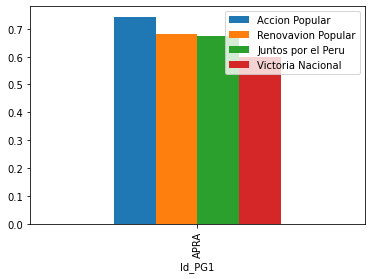

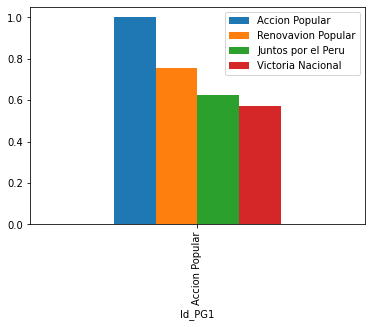

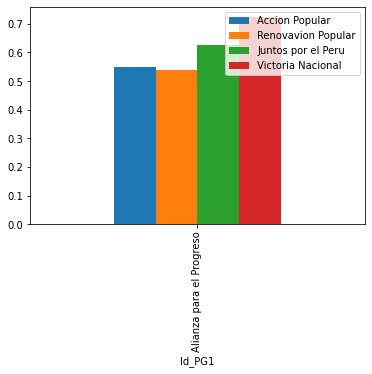

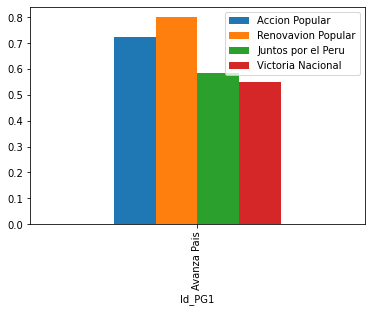

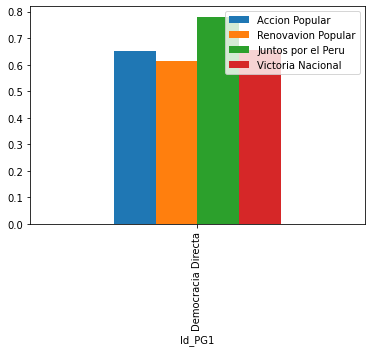

...

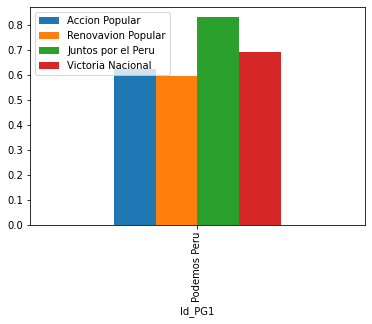

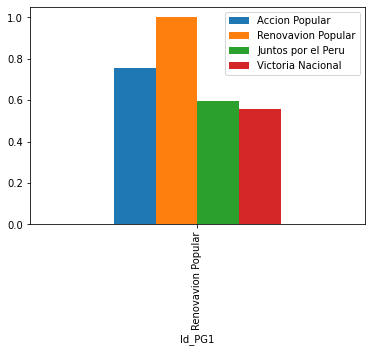

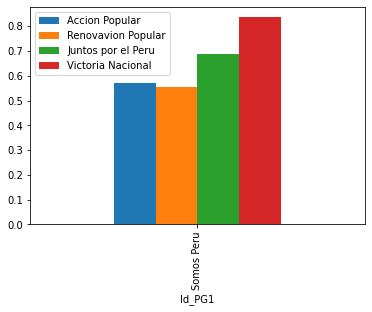

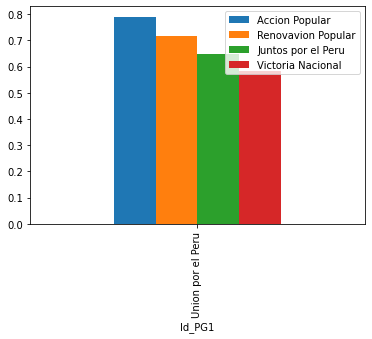

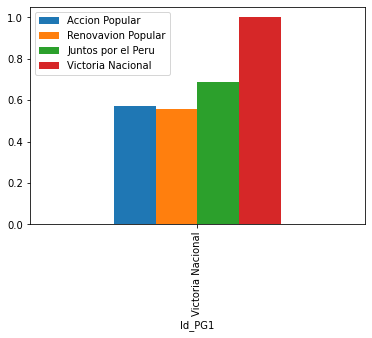

In [28]:
plotbar=invoices.groupby(['Id_PG1','Accion Popular','Renovavion Popular','Juntos por el Peru','Victoria Nacional'])
plotbar.plot(kind='bar')
plt.show()

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("JaroW_agenda_2030.csv") 
df

,Id_PG1,Id_PG2,JaroW_Dictance
0,Accion Popular,Agenda 2030,0.727539
1,Partido Morado,Agenda 2030,0.553402
2,Avanza Pais,Agenda 2030,0.805236
3,Alianza para el Progreso,Agenda 2030,0.536735
4,APRA,Agenda 2030,0.662496
5,Democracia Directa,Agenda 2030,0.602672
6,Frente Amplio,Agenda 2030,0.595490
7,Frente Esperanza,Agenda 2030,0.660532
8,Fuerza Popular,Agenda 2030,0.581991
9,Juntos por el Peru,Agenda 2030,0.585625


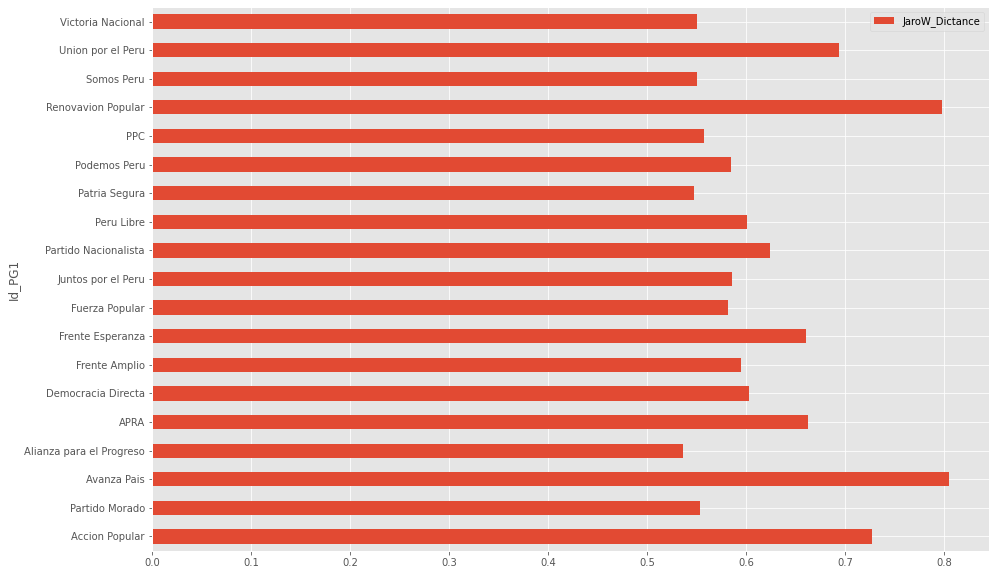

In [67]:
from matplotlib import style
style.use('ggplot')|df.plot(x='Id_PG1',kind='barh', rot=0, figsize=(15, 10))
plt.show()

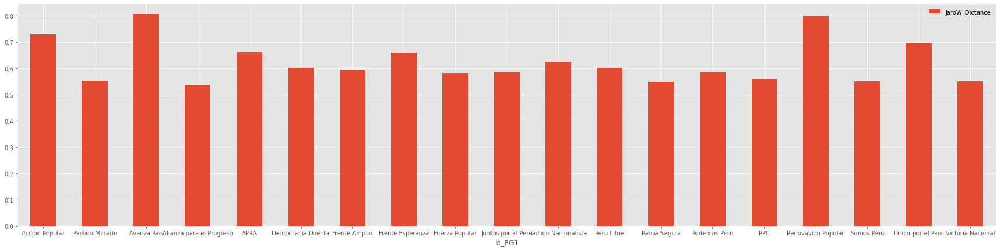

In [59]:
from matplotlib import style
style.use('ggplot')
df.plot(x='Id_PG1',kind='bar', rot=0, figsize=(30, 7))
plt.show()

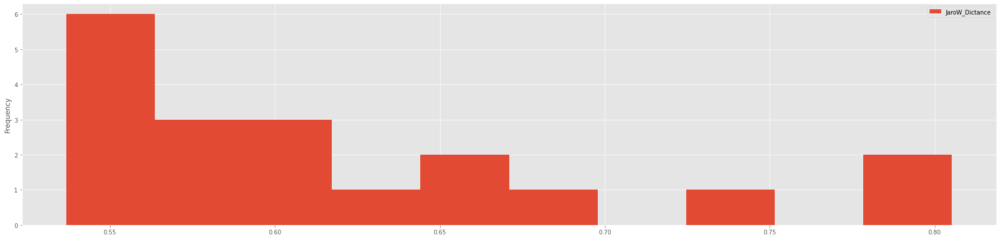

In [64]:
df.plot(x='Id_PG1',kind='hist', rot=0, figsize=(30, 7))
plt.show()

In [36]:
for h in Corpus:
    for j in h:
        print(j,"\n","\n")

doctrina propuesta accion popular ladron mentiroso ocioso oro pies nunca agache recogerlo fernando belaunde terry reinstalar honestidad dejar trabajarama doctrina presidente belaunde universalizo etica ancestros incas etica hoy siempre ahora nunca etica recuperarla ladron mentiroso ocioso compromiso accion popular acabar corrupcion lleva millonescada reinstaurar valores integridad proactividad gestionpublica corrupcion mayor preocupacion millones peruanos accion popular autoridad moral pristina honradez fernando belaunde manejo cosa publica asume reto rescatar garras corrupcion capturado vergonzosa marca mundial unico seis presidentes republica procesados investigados profugos presos corrupcion derrotamos corrupcion cualquier haga sera ilusorio compromiso accion popular primer lugar devolverle dignidad respeto autoridad credibilidad investidura presidencial devolver confianza pueblo instituciones publicas ap autentico politico unico sustento ideologia inspirada legado historico antiguo

In [35]:
Corpus

[['doctrina propuesta accion popular ladron mentiroso ocioso oro pies nunca agache recogerlo fernando belaunde terry reinstalar honestidad dejar trabajarama doctrina presidente belaunde universalizo etica ancestros incas etica hoy siempre ahora nunca etica recuperarla ladron mentiroso ocioso compromiso accion popular acabar corrupcion lleva millonescada reinstaurar valores integridad proactividad gestionpublica corrupcion mayor preocupacion millones peruanos accion popular autoridad moral pristina honradez fernando belaunde manejo cosa publica asume reto rescatar garras corrupcion capturado vergonzosa marca mundial unico seis presidentes republica procesados investigados profugos presos corrupcion derrotamos corrupcion cualquier haga sera ilusorio compromiso accion popular primer lugar devolverle dignidad respeto autoridad credibilidad investidura presidencial devolver confianza pueblo instituciones publicas ap autentico politico unico sustento ideologia inspirada legado historico anti

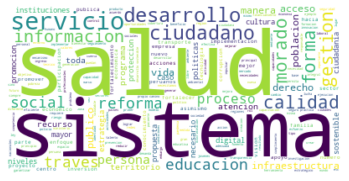

In [68]:
# Start with one review:
#text = df.description[0]
import wikipedia
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
TextPlan = " ".join([str(k) for k in Corpus[1]])
# Create and generate a word cloud image:
wordcloud = WordCloud(  background_color='white',).generate(TextPlan)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear',)
plt.axis("off")
plt.show()

In [58]:
TextPlan = " ".join([str(k) for k in Corpus[4]])
TextPlan

'aprista diciembre logrado formar hombres hecho escuela veteranos fundamos movimiento hacia vienen vendran hornadas elementos nuevos aprismo morira fundadores ensayos matarlo hecho fracaso aprismo proseguir gran andadura historica buena avanzada hacia futuro pensar fundador vale significa renunciamiento abandono rendicion debilidad parte discurso veto victor raul lima julio formato adaptado anexo resolucion jnepresentacion cumplimiento ley electoral ponemos disposicion ciudadania aprista elaborado periodo constitucional fe pueblo futuro pesar enfrentando peor crisis sanitaria economica social ultimos tiempos queremos recupere confianza retomemos senda crecimiento economico inversion justicia social democracia queremos peruanos salgan pobreza eleven niveles vida queremos clase media siga creciendo consolide progreso labrado enorme esfuerzo campana embargo producto interaccion diferentes sectores sociedad seguiremos enriqueciendo manera pueblo dispone voto listos mismo julio recuperar ti

In [69]:
Corpus1=[]
Corpus1.append(accion_pupular_text)
Corpus1.append(Partido_Morado_text)
Corpus1.append(Partido_Avanza_Pais_text)
Corpus1.append(Alianza_Progreso_text)
Corpus1.append(APRA_text)
Corpus1.append(Democracia_directa_text)
Corpus1.append(Frente_amplio_text)
Corpus1.append(Frente_esperanza_text)
Corpus1.append(Fuerza_popular_text)
Corpus1.append(Juntos_peru_text)
Corpus1.append(Partido_nacionalista_text)
Corpus1.append(Peru_libre_text)
Corpus1.append(Patria_segura_text)
Corpus1.append(Podemos_text)
Corpus1.append(PPC_text)
Corpus1.append(Renovacion_pupular_text)
Corpus1.append(Somos_peru_text)
Corpus1.append(Union_peru_text)
Corpus1.append(Victoria_nacional_text)

In [84]:
aa=[]
for gg in Corpus1:
    for fg in 
    aa.append(TextPlan)

In [72]:
Corpus1

['doctrina propuesta accion popular ladron mentiroso ocioso oro pies nunca agache recogerlo fernando belaunde terry reinstalar honestidad dejar trabajarama doctrina presidente belaunde universalizo etica ancestros incas etica hoy siempre ahora nunca etica recuperarla ladron mentiroso ocioso compromiso accion popular acabar corrupcion lleva millonescada reinstaurar valores integridad proactividad gestionpublica corrupcion mayor preocupacion millones peruanos accion popular autoridad moral pristina honradez fernando belaunde manejo cosa publica asume reto rescatar garras corrupcion capturado vergonzosa marca mundial unico seis presidentes republica procesados investigados profugos presos corrupcion derrotamos corrupcion cualquier haga sera ilusorio compromiso accion popular primer lugar devolverle dignidad respeto autoridad credibilidad investidura presidencial devolver confianza pueblo instituciones publicas ap autentico politico unico sustento ideologia inspirada legado historico antig

In [85]:
aa

['doctrina propuesta accion popular ladron mentiroso ocioso oro pies nunca agache recogerlo fernando belaunde terry reinstalar honestidad dejar trabajarama doctrina presidente belaunde universalizo etica ancestros incas etica hoy siempre ahora nunca etica recuperarla ladron mentiroso ocioso compromiso accion popular acabar corrupcion lleva millonescada reinstaurar valores integridad proactividad gestionpublica corrupcion mayor preocupacion millones peruanos accion popular autoridad moral pristina honradez fernando belaunde manejo cosa publica asume reto rescatar garras corrupcion capturado vergonzosa marca mundial unico seis presidentes republica procesados investigados profugos presos corrupcion derrotamos corrupcion cualquier haga sera ilusorio compromiso accion popular primer lugar devolverle dignidad respeto autoridad credibilidad investidura presidencial devolver confianza pueblo instituciones publicas ap autentico politico unico sustento ideologia inspirada legado historico antig